In [19]:
import cv2
import numpy as np
import matplotlib.pyplot as plt

ISODATA

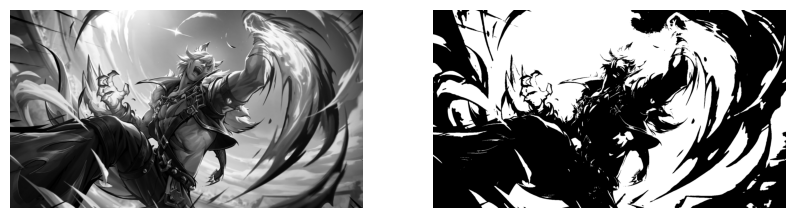

In [1]:
import cv2
import numpy as np
import matplotlib.pyplot as plt

def isodata(imagen):
    umbral = 128
    while True:
        grupo1 = imagen[imagen <= umbral]
        grupo2 = imagen[imagen >= umbral]

        mediag1 = np.mean(grupo1)
        mediag2 = np.mean(grupo2)

        umbral_n = (mediag1 + mediag2) / 2

        if abs(umbral_n - umbral) < 0.5:
            break
        umbral = umbral_n
    return umbral

imagen = cv2.imread("Imagenjpg.jpg", 0)

umbral_iso = isodata(imagen)

_, img_iso = cv2.threshold(imagen, umbral_iso, 255, cv2.THRESH_BINARY)

plt.figure(figsize=(10,5))
plt.subplot(121)
plt.imshow(imagen, cmap='gray')
plt.axis("off")
plt.subplot(122)
plt.imshow(img_iso, cmap='gray')
plt.axis("off")
plt.show()

2 picos

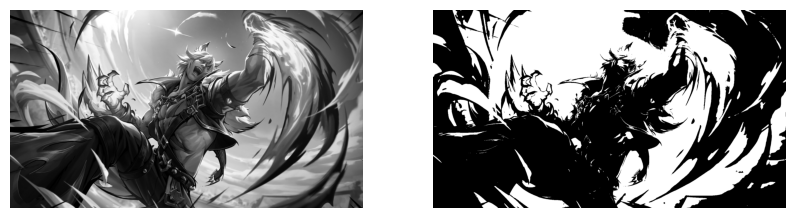

In [2]:
def dos_picos(imagen):
    hist = cv2.calcHist([imagen], [0], None, [256], [0, 256])
    pico = np.array(hist)
    pico = pico.flatten()
    pico_dif =np.diff(pico)
    pico1 = np.argmax(pico_dif[:128])
    pico2 = np.argmax(pico_dif[128:]) + 128
    umbral = int((pico1 + pico2) / 2)
    return umbral

imagen = cv2.imread("Imagenjpg.jpg", 0)

umbral_2p = dos_picos(imagen)

_, img_2p = cv2.threshold(imagen, umbral_2p, 255, cv2.THRESH_BINARY)

plt.figure(figsize=(10,5))
plt.subplot(121)
plt.imshow(imagen, cmap='gray')
plt.axis("off")
plt.subplot(122)
plt.imshow(img_2p, cmap='gray')
plt.axis("off")
plt.show()

OTSU

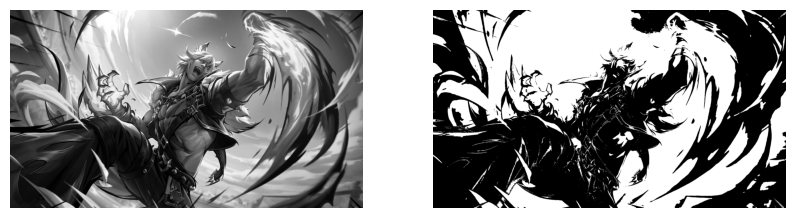

In [3]:
imagen = cv2.imread("Imagenjpg.jpg", 0)

_, img_otsu = cv2.threshold(imagen, 0, 255, cv2.THRESH_BINARY + cv2.THRESH_OTSU)

umbral = np.where(imagen > img_otsu, 0, 255).astype(np.uint8)

plt.figure(figsize=(10,5))
plt.subplot(121)
plt.imshow(imagen, cmap='gray')
plt.axis("off")
plt.subplot(122)
plt.imshow(umbral, cmap='gray')
plt.axis("off")
plt.show()

UMBRALIZACION VARIABLE - PARTICION DE UNA IMAGEN

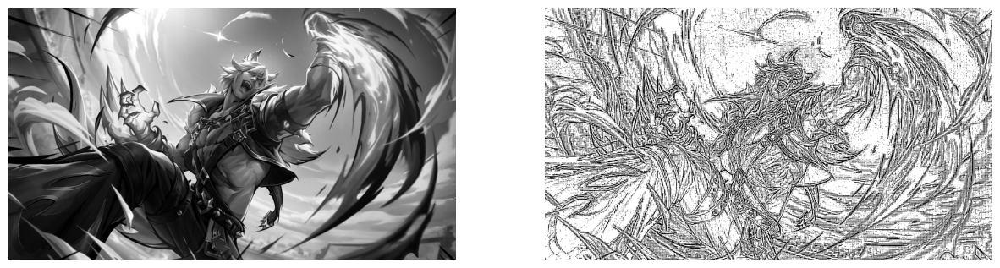

In [4]:
def var_umb_block(imagen, tamanio, c):
    umbral = np.zeros_like(imagen)
    for i in range(0, imagen.shape[0], tamanio):
        for j in range(0, imagen.shape[1], tamanio):
            bloque = imagen[i:i+tamanio,j:j+tamanio]
            media = np.mean(bloque)
            umbrala = media - c
            umbral[i:i+tamanio, j:j+tamanio] = (bloque > umbrala) * 255
    return umbral
    
imagen = cv2.imread("Imagenjpg.jpg", 0)
tamanio = 5
c = 1

umbral = var_umb_block(imagen, tamanio, c)

plt.figure(figsize=(15,5))
plt.subplot(121)
plt.imshow(imagen, cmap='gray')
plt.axis("off")
plt.subplot(122)
plt.imshow(umbral, cmap='gray')
plt.axis("off")
plt.show()

CON DESVIACION

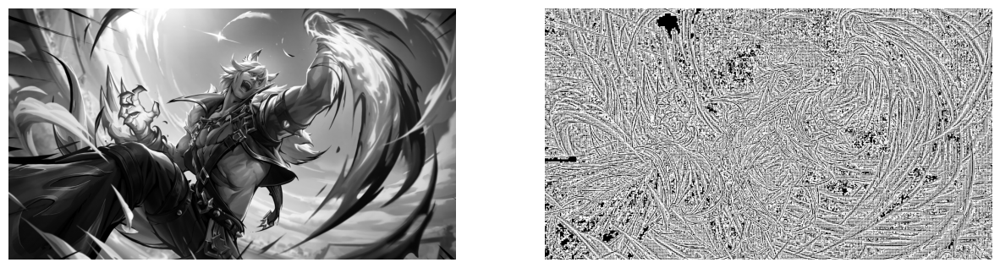

In [5]:
def var_umb_block(imagen, tamanio, c):
    umbral = np.zeros_like(imagen)
    for i in range(0, imagen.shape[0], tamanio):
        for j in range(0, imagen.shape[1], tamanio):
            bloque = imagen[i:i+tamanio,j:j+tamanio]
            media = np.mean(bloque)
            desviacion = np.std(bloque)
            umbrala = media - (c * desviacion)
            umbral[i:i+tamanio, j:j+tamanio] = (bloque > umbrala) * 255
    return umbral
    
imagen = cv2.imread("Imagenjpg.jpg", 0)
tamanio = 5
c = 0.5

umbral = var_umb_block(imagen, tamanio, c)

plt.figure(figsize=(15,5))
plt.subplot(121)
plt.imshow(imagen, cmap='gray')
plt.axis("off")
plt.subplot(122)
plt.imshow(umbral, cmap='gray')
plt.axis("off")
plt.show()

VENTANA

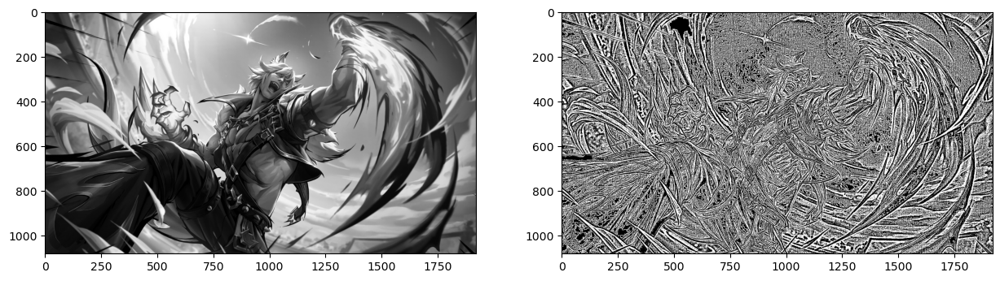

In [6]:
def ventana(imagen, window, factor):
    umbral = np.zeros_like(imagen)
    pad = window // 2
    pad_img = cv2.copyMakeBorder(imagen, pad, pad, pad, pad, cv2.BORDER_REPLICATE)
    for y in range(imagen.shape[0]):
        for x in range(imagen.shape[1]):
            ventana1 = pad_img[y:y+window,x:x+window]
            media = np.mean(ventana1)
            dis = np.std(ventana1)
            umbrala = media - (factor * dis)
            umbral[y,x] = 255 if imagen[y,x]>umbrala else 0
    return umbral

imagen = cv2.imread("Imagenjpg.jpg", 0)
tamanio = 5
c = 0.01

umbral = ventana(imagen, tamanio, c)

plt.figure(figsize=(15,5))
plt.subplot(121)
plt.imshow(imagen, cmap='gray')
plt.subplot(122)
plt.imshow(umbral, cmap='gray')
plt.show()

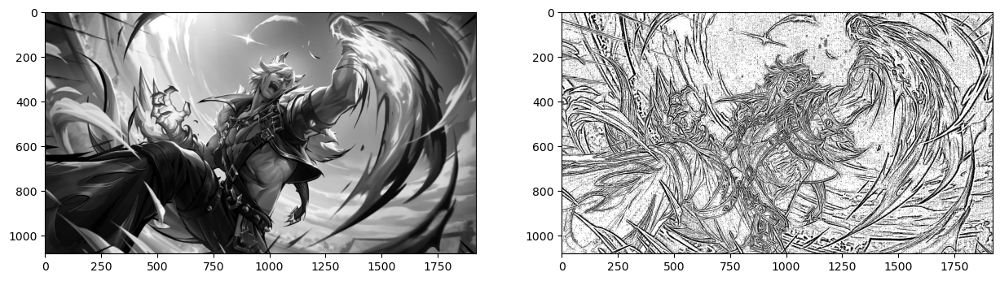

In [7]:
imagen = cv2.imread("Imagenjpg.jpg", 0)
tamanio = 5
c = 0.1

umbral = cv2.adaptiveThreshold(imagen, 255, cv2.ADAPTIVE_THRESH_MEAN_C, cv2.THRESH_BINARY, tamanio, c)

plt.figure(figsize=(15,5))
plt.subplot(121)
plt.imshow(imagen, cmap='gray')
plt.subplot(122)
plt.imshow(umbral, cmap='gray')
plt.show()

Umbralizaciones por defecto tuzero en opencv

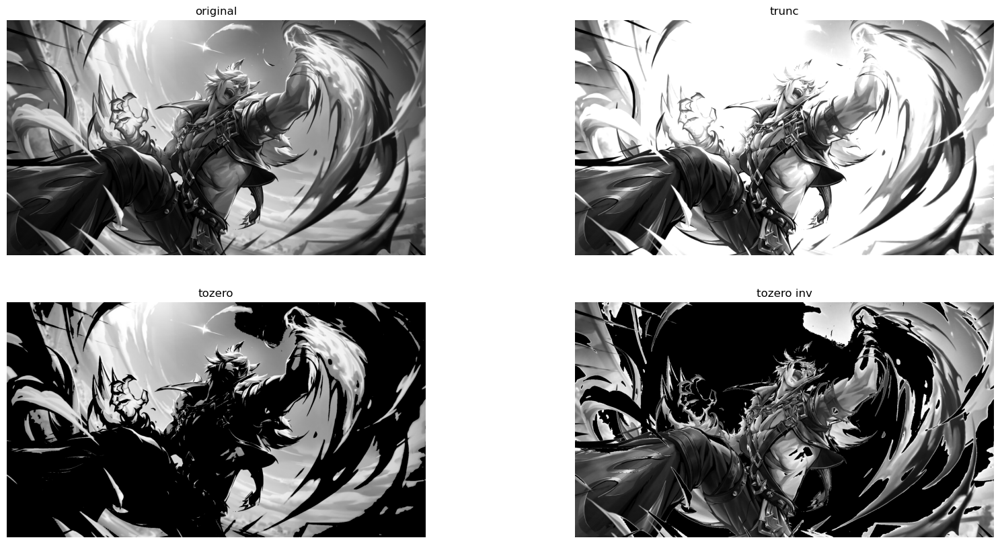

In [8]:
import cv2
import numpy as np
import matplotlib.pyplot as plt

imagen = cv2.imread('Imagenjpg.jpg', 0)
_, umbr_trunc = cv2.threshold(imagen, 127, 255, cv2.THRESH_TRUNC)
_, umbr_tozero = cv2.threshold(imagen, 127, 255, cv2.THRESH_TOZERO)
_, umbr_tozero_inv = cv2.threshold(imagen, 127, 255, cv2.THRESH_TOZERO_INV)
plt.figure(figsize=(20, 10))
plt.subplot(221)
plt.title('original')
plt.imshow(imagen, cmap='gray')
plt.axis('off')

plt.subplot(222)
plt.title('trunc')
plt.imshow(umbr_trunc, cmap='gray')
plt.axis('off')

plt.subplot(223)
plt.title('tozero')
plt.imshow(umbr_tozero, cmap='gray')
plt.axis('off')

plt.subplot(224)
plt.title('tozero inv')
plt.imshow(umbr_tozero_inv, cmap='gray')
plt.axis('off')
plt.show()

Negativo

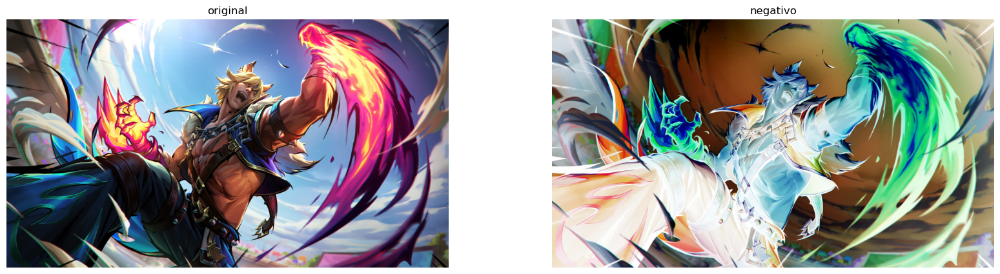

In [9]:
import cv2
import numpy as np
import matplotlib.pyplot as plt

imagen = cv2.imread('Imagenjpg.jpg', cv2.IMREAD_COLOR_RGB)

img_neg = 255 - imagen
plt.figure(figsize=(20,5))
plt.subplot(121)
plt.title('original')
plt.imshow(imagen)
plt.axis('off')

plt.subplot(122)
plt.title('negativo')
plt.imshow(img_neg)
plt.axis('off')
plt.show()

Contraste

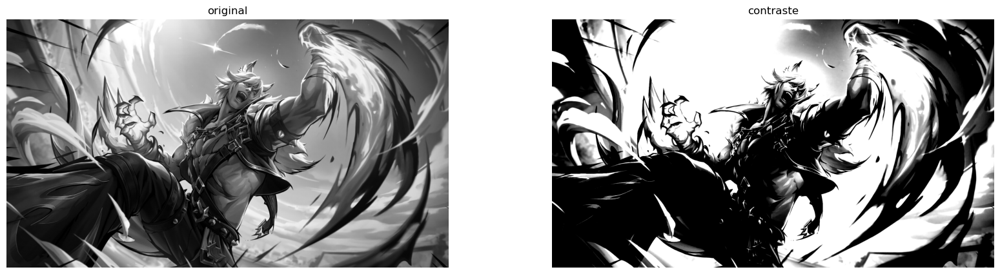

In [10]:
import cv2
import numpy as np
import matplotlib.pyplot as plt

def contraste(img, factor = 1.0):
    img = img.astype(np.float32)
    media = np.mean(img)
    img_contraste = media + (img - media) * factor
    img_contraste = np.clip(img_contraste, 0, 255).astype(np.uint8)
    return img_contraste

imagen = cv2.imread('Imagenjpg.jpg', 0)
factor_contraste = 4
img_nueva = contraste(imagen, factor_contraste)

plt.figure(figsize=(20,5))
plt.subplot(121)
plt.title('original')
plt.imshow(imagen, cmap='gray')
plt.axis('off')

plt.subplot(122)
plt.title('contraste')
plt.imshow(img_nueva, cmap='gray')
plt.axis('off')
plt.show()

Contraste a colores

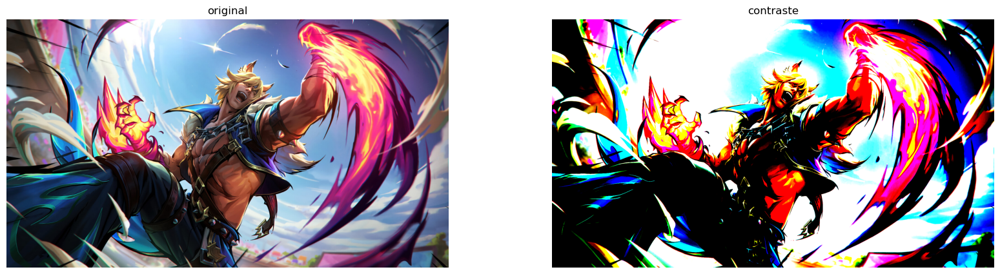

In [11]:
import cv2
import numpy as np
import matplotlib.pyplot as plt

def contraste_color(img, factor = 1.0):
    img = img.astype(np.float32)
    for i in range(3):
        media = np.mean(img[:,:,i])
        img[:,:,i] = media + (img[:,:,i] - media) * factor
        img[:,:,i] = np.clip(img[:,:,i], 0, 255)
    img = img.astype(np.uint8)
    return img

imagen = cv2.imread('Imagenjpg.jpg', cv2.IMREAD_COLOR_RGB)
factor_contraste = 10
img_nueva = contraste_color(imagen, factor_contraste)

plt.figure(figsize=(20,5))
plt.subplot(121)
plt.title('original')
plt.imshow(imagen)
plt.axis('off')

plt.subplot(122)
plt.title('contraste')
plt.imshow(img_nueva)
plt.axis('off')
plt.show()

Brillo

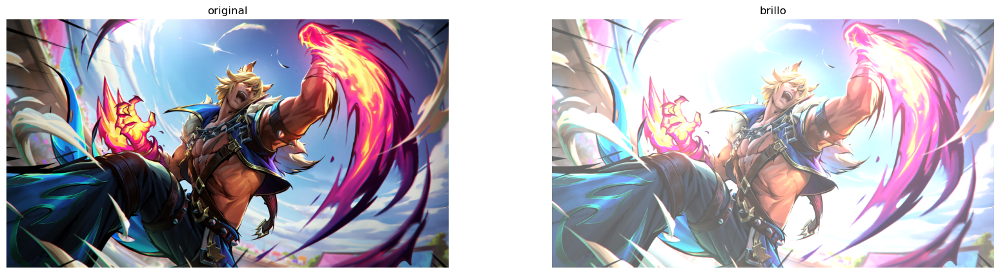

In [12]:
import cv2
import numpy as np
import matplotlib.pyplot as plt

def brillo(img, brillo = 0):
    img_brillo = img.astype(np.float32) + brillo
    img_brillo = np.clip(img_brillo, 0, 255).astype(np.uint8)
    return img_brillo

imagen = cv2.imread('Imagenjpg.jpg', cv2.IMREAD_COLOR_RGB)
brillo1 = 100
img_nueva = brillo(imagen, brillo1)

plt.figure(figsize=(20,5))
plt.subplot(121)
plt.title('original')
plt.imshow(imagen)
plt.axis('off')

plt.subplot(122)
plt.title('brillo')
plt.imshow(img_nueva)
plt.axis('off')
plt.show()

Contraste y brillo

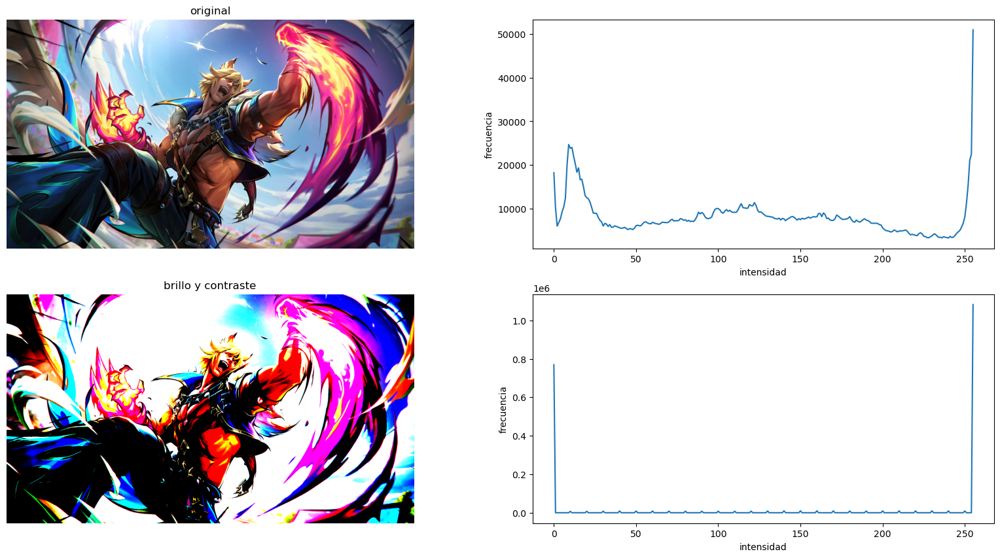

In [13]:
import cv2
import numpy as np
import matplotlib.pyplot as plt

def ajustar(img, contraste = 1.0, brillo = 0):
    img = img.astype(np.float32)
    media = np.mean(img)
    img = media + (img - media) * contraste + brillo
    img = np.clip(img, 0, 255).astype(np.uint8)
    return img

imagen = cv2.imread('Imagenjpg.jpg', cv2.IMREAD_COLOR_RGB)
factor_brillo = 200
factor_contraste = 10
img_nueva = ajustar(imagen, factor_contraste, factor_brillo)

hist1 = cv2.calcHist([imagen], [0], None, [256], [0, 256])
hist2 = cv2.calcHist([img_nueva], [0], None, [256], [0, 256])

plt.figure(figsize=(20,10))
plt.subplot(221)
plt.title('original')
plt.imshow(imagen)
plt.axis('off')

plt.subplot(222)
plt.plot(hist1)
plt.xlabel('intensidad')
plt.ylabel('frecuencia')

plt.subplot(223)
plt.title('brillo y contraste')
plt.imshow(img_nueva)
plt.axis('off')

plt.subplot(224)
plt.plot(hist2)
plt.xlabel('intensidad')
plt.ylabel('frecuencia')
plt.show()

Ejercicio 1 degradados

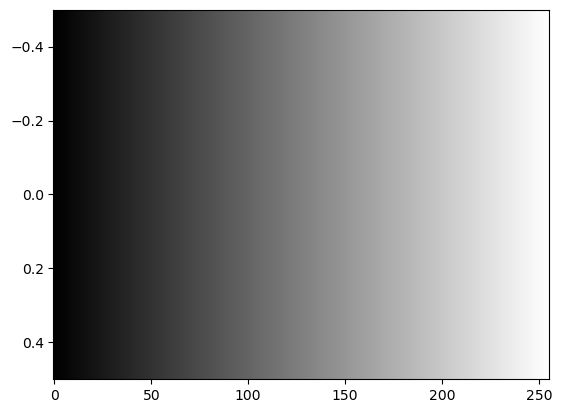

In [14]:
import cv2
import numpy as np
import matplotlib.pyplot as plt
from matplotlib.colors import LinearSegmentedColormap

#definicion de colores
colores = [(0, 'black'), (1, 'white')] #generar escala de grises
cmap = LinearSegmentedColormap.from_list('degrade', colores) #generar el cmap
imagen = cmap(np.linspace(0, 1, 256))
plt.imshow([imagen], aspect='auto')
plt.show()

Degradado a color

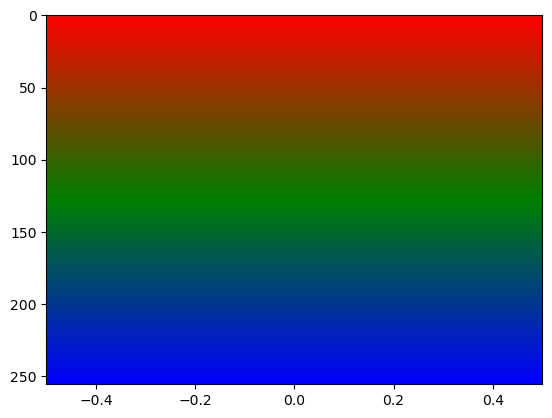

In [15]:
import cv2
import numpy as np
import matplotlib.pyplot as plt
from matplotlib.colors import LinearSegmentedColormap

#definicion de colores
colores = [(0, 'red'), (0.5, 'green'), (1, 'blue')] #generar escala de grises
cmap = LinearSegmentedColormap.from_list('degrade', colores) #generar el cmap
imagen = cmap(np.linspace(0, 1, 256).reshape(-1,1))
img = np.tile(imagen, (1,255,1))*255
img = img.astype(np.uint8)
plt.imshow(imagen, aspect='auto')
plt.show()

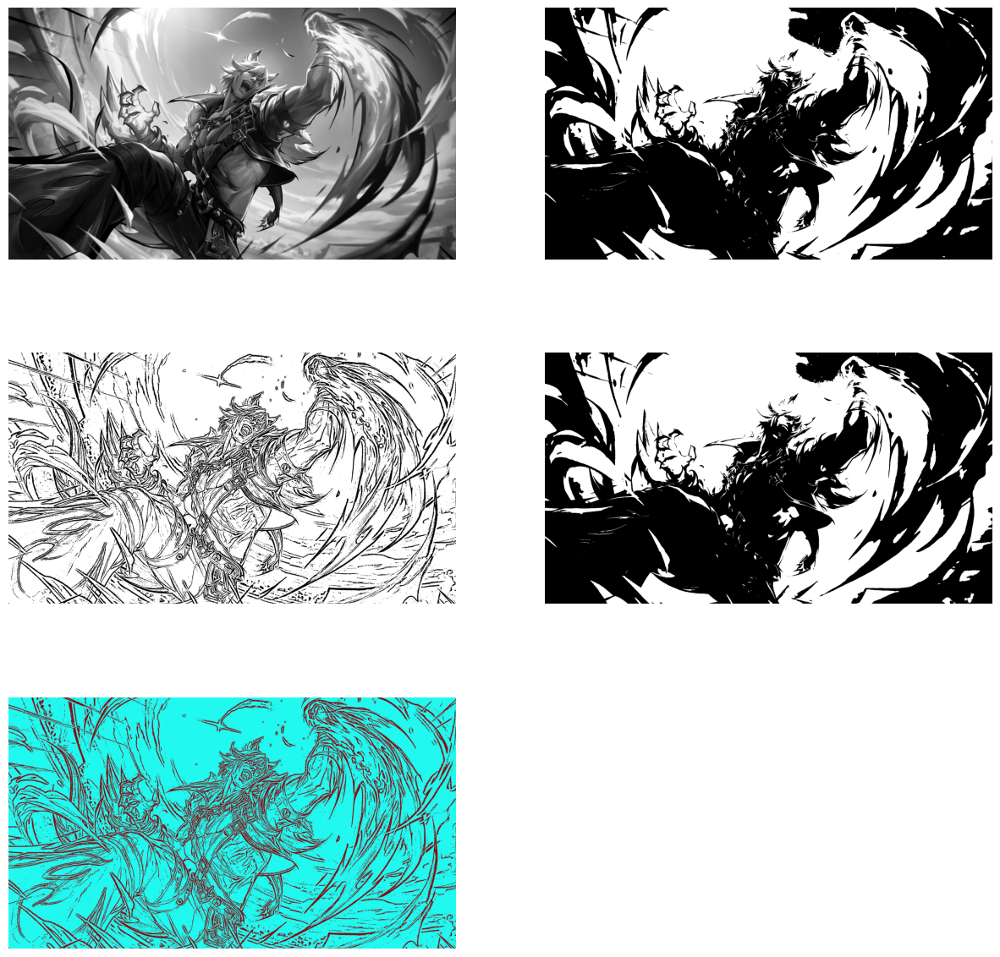

In [16]:
import matplotlib.pyplot as plt
import cv2

imagen = cv2.imread('Imagenjpg.jpg', 0)

_, umbral_bin = cv2.threshold(imagen, 127, 255, cv2.THRESH_BINARY)
umbral_adap = cv2.adaptiveThreshold(imagen, 255, cv2.ADAPTIVE_THRESH_GAUSSIAN_C, cv2.THRESH_BINARY, 11, 2)
_, umbral_otsu = cv2.threshold(imagen, 0, 255, cv2.THRESH_BINARY + cv2.THRESH_OTSU)

color = cv2.applyColorMap(umbral_adap, cv2.COLORMAP_PLASMA)
plt.figure(figsize=(15, 15))
plt.subplot(321)
plt.imshow(imagen, cmap='gray')
plt.axis('off')

plt.subplot(322)
plt.imshow(umbral_bin, cmap='gray')
plt.axis('off')

plt.subplot(323)
plt.imshow(umbral_adap, cmap='gray')
plt.axis('off')

plt.subplot(324)
plt.imshow(umbral_otsu, cmap='gray')
plt.axis('off')

plt.subplot(325)
plt.imshow(color, cmap='gray')
plt.axis('off')
plt.show()

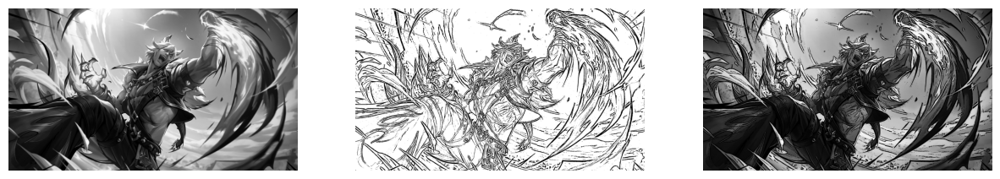

In [17]:
import cv2
import matplotlib.pyplot as plt

imagen = cv2.imread('Imagenjpg.jpg', 0)

umbral_adap = cv2.adaptiveThreshold(imagen, 255, cv2.ADAPTIVE_THRESH_GAUSSIAN_C, cv2.THRESH_BINARY, 11, 2)
img = cv2.bitwise_and(imagen, imagen, mask=umbral_adap)

plt.figure(figsize=(15, 10))
plt.subplot(131)
plt.imshow(imagen, cmap='gray')
plt.axis('off')

plt.subplot(132)
plt.imshow(umbral_adap, cmap='gray')
plt.axis('off')

plt.subplot(133)
plt.imshow(img, cmap='gray')
plt.axis('off')
plt.show()

Solarizacion

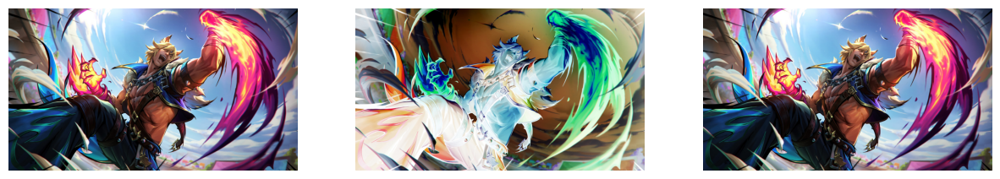

In [18]:
import cv2
import numpy as np
import matplotlib.pyplot as plt

imagen = cv2.imread('Imagenjpg.jpg', cv2.IMREAD_COLOR_RGB)

def solarizar(imagen, umbral):
    img_sol = np.where(imagen < umbral, imagen, 255 - imagen)
    return img_sol

img_sol = solarizar(imagen, 0)
img_neg = 255 - img_sol
plt.figure(figsize=(15, 10))
plt.subplot(131)
plt.imshow(imagen)
plt.axis('off')

plt.subplot(132)
plt.imshow(img_sol)
plt.axis('off')

plt.subplot(133)
plt.imshow(img_neg)
plt.axis('off')
plt.show()

Ecualizacion

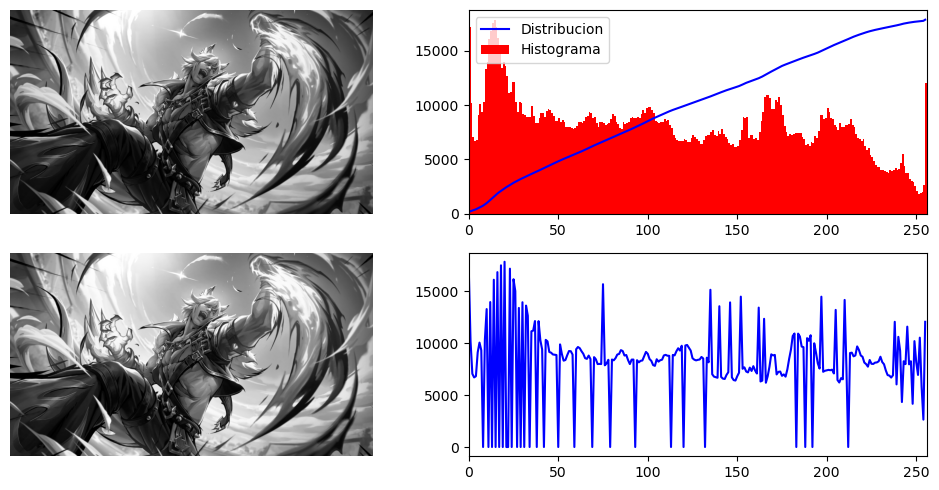

In [11]:
import cv2
import numpy as np
import matplotlib.pyplot as plt

imagen = cv2.imread('Imagenjpg.jpg', 0)

histograma, calc =np.histogram(imagen.flatten(), 256, (0, 256))
distAcum = histograma.cumsum()
distAcumNorm = distAcum * histograma.max() / distAcum.max()

ecualizado = cv2.equalizeHist(imagen)
histogramaEqu, bins = np.histogram(ecualizado.flatten(), 256, (0, 256))

plt.figure(figsize=(10, 5))
plt.subplot(221)
plt.imshow(imagen, cmap='gray')
plt.axis('off')

plt.subplot(222)
plt.plot(distAcumNorm, color='b')
plt.hist(imagen.flatten(), bins=256, range=(0, 256), color='r')
plt.xlim((0, 256))
plt.legend(['Distribucion', 'Histograma'], loc='upper left')

plt.subplot(223)
plt.imshow(ecualizado, cmap='gray')
plt.axis('off')

plt.subplot(224)
plt.plot(bins[:-1], histogramaEqu, color='b')
plt.xlim((0, 256))
plt.tight_layout()
plt.show()

Ecualizacion a color

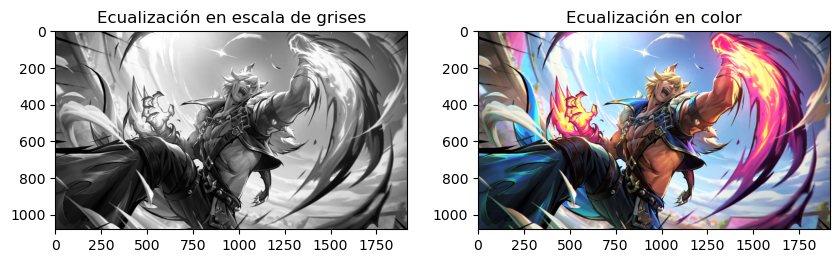

In [18]:
import cv2
import numpy as np
import matplotlib.pyplot as plt

imagen = cv2.imread('Imagenjpg.jpg', cv2.IMREAD_COLOR)

imagen_gris = cv2.cvtColor(imagen, cv2.COLOR_BGR2GRAY)
ecualizada = cv2.equalizeHist(imagen_gris)

imagen_ycrcb = cv2.cvtColor(imagen, cv2.COLOR_BGR2YCrCb)
imagen_ycrcb[:, :, 0] = cv2.equalizeHist(imagen_ycrcb[:, :, 0])
ecuColor = cv2.cvtColor(imagen_ycrcb, cv2.COLOR_YCrCb2BGR)

plt.figure(figsize=(10, 5))

plt.subplot(1, 2, 1)
plt.imshow(ecualizada, cmap='gray')
plt.title('Ecualización en escala de grises')

plt.subplot(1, 2, 2)
plt.imshow(cv2.cvtColor(ecuColor, cv2.COLOR_BGR2RGB))
plt.title('Ecualización en color')

plt.show()


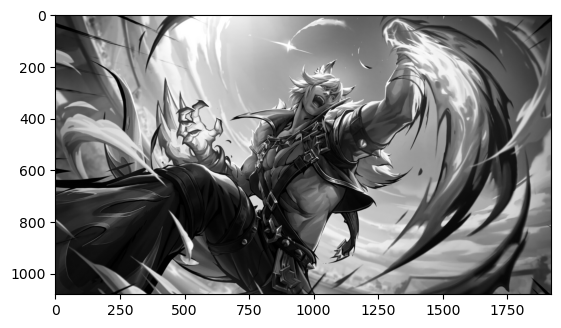

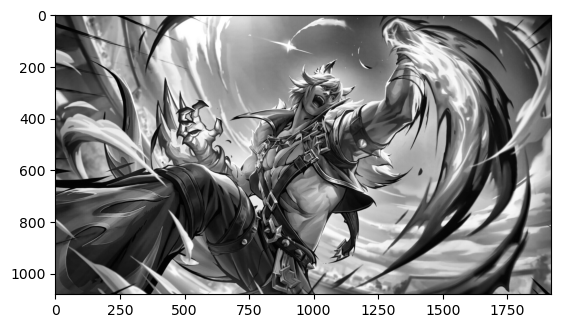

In [20]:
import cv2
import numpy as np
import matplotlib.pyplot as plt

image = cv2.imread('imagenjpg.jpg',0)
clip = 2.0
tiles = 8

clahe = cv2.createCLAHE(clipLimit=clip, tileGridSize=(tiles, tiles))

ecualizado = clahe.apply(image)

plt.imshow(image, cmap='gray')
plt.show()

plt.imshow(ecualizado, cmap='gray')
plt.show()

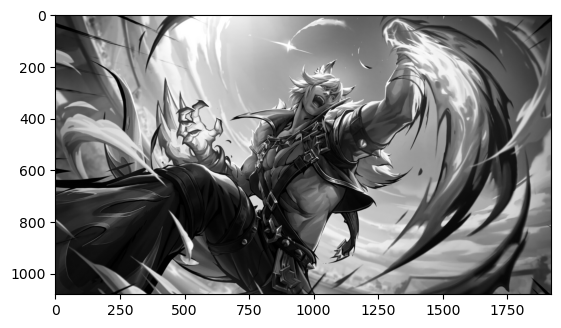

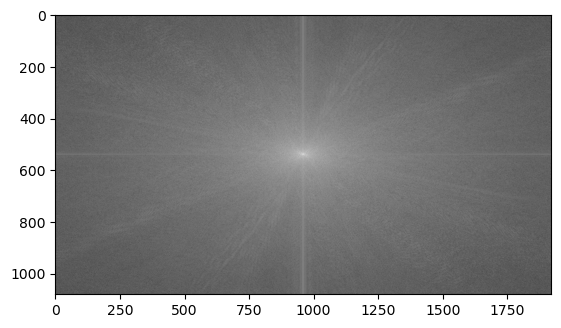

In [21]:
import cv2
import numpy as np
import matplotlib.pyplot as plt

image = cv2.imread('imagenjpg.jpg',0)

transformada=np.fft.fft2(image)

desplazar=np.fft.fftshift(transformada)


magnitud_espectro=np.log(1+np.abs(desplazar))

plt.imshow(image,cmap='gray')
plt.show()
plt.imshow(magnitud_espectro,cmap='gray')
plt.show()